
#####        **Lakshmi Deepika Pinnamaraju**
######         **Week 7 & 8 Project**         

**Overview of the Project:**

I have selected image super resolution dataset from Kaggle site. The dataset contains high resolution and low resolution images. The project is about converting low resolution images into high resolution images using keras models. The project covers the following:
* Import required libraries
* Load the dataset from kaggle
* Visualizing the data and Displaying sample images with labels
* Slicing and Reshaping data/images into train,test and validation sets
* Defining and Implementing model(used batch normalization, dropout, learning rate optimization, epochs, kernel regularizers, functional API model, convolutional layers, activation and loss functions)
* Compiling the model
* Evaluating the model using test data
* Plotting accuracy/loss vs epochs
* Visualizing the predicted high resolution images
* Calculating PSNR(Peak Signal-to-Noise ratio) and SSIM(Structural Similarity Index) to get more insights about the quality and similarity of the generated high-resolution images compared to the true low-resolution images.
*Saving the models for future use when required
*Analyzing the results


**Description of the data:**

- The dataset archive.zip which I have downloaded from Kaggle image super resolution has three folders: Raw data, train and val. But I am only going to use the Raw data which has two folders: high_res and low_res. I am latter splitting this data into train, test and validation sets.

- high_res folder has 855 high resolution images and low_res folder has 855 low resolution images.

- I want to convert 855 low resolution images into high resolution images.



**Summary of methods & Summary of models:**

* **SEQUENTIAL MODEL**: I have created a sequential model with both upsampling and downsampling block which are common to be used in image processing tasks. Several convolutional layers are used in both upsample and downsample blocks with leakyReLu as activation and an optional batchnormalization in downsample and optional dropout of 0.2 in upsample layers. **Hidden layers** with ***'leakyReLU'*** as activation and **output layer** as '***linear***' activation which is by default if not mentioned and this activation is commonly used for image processing tasks. Model is optimized using learning rate schedulers with learning rate 0.001 for epochs less than 5 and for above 5 learning rate is 0.001*0.1. Compiled the model using optimizer "adam", loss "mean absolute error" and metrics "accuracy". Trained the model on training data using 10 epochs and batch size of 32 using a small validation set to monitor model's progress and prevent overfitting. After training, the model.fit function returns a history object that contains information about the training process, such as the loss and accuracy metrics at each epoch and plots the accuracy/loss vs epcohs. Predicted high resolution images are plotted and calculated validation metrics like ssim(Structural similarity index) and PSNR(Peak Signal-to-Noise Ratio) for getting more insights about the predicted image. After running the 10 epochs i have got an accuracy of 68%. Accuracy can be improved by increasing the number of epochs.

* **FUNCTIONAL API MODEL**: I have then created a functional api model with upsample and downsample blocks having several convolutional layers in them and upsample with optional dropout of 0.2 and downsample with optional batch normalization. Hidden layers have "leakyRelu" as activation and output layer with "tanh" as activation. Model is optimized using learning rate schedulers with learning rate 0.001 for the first 5 epochs, then reduced by a factor of 10 for epochs 5 to 9, and further reduced by a factor of 10 for epochs 10 and beyond. Compiled the model using "adam" optimizer, loss "mean squared error" and metrics "accuracy". Fitted the train data to model by increasing epochs to 15 and also batch size to 64 with a thought that increasing them increases the model performance. As I have thought, after evaluating the model on test data, got an accuracy of 72%. So, as expected accuracy increased a bit. Plotted the accuracy/loss vs epcohs, Predicted high resolution images are plotted and calculated validation metrics like ssim(Structural similarity index) and PSNR(Peak Signal-to-Noise Ratio).

* **VGG16 MODEL**: I have created a VGG16 model with pre-trained weights from imagenet being loaded into the model but are freezed during training by setting "vgg.trainable" parameter as False. Hidden layers have "Relu" as activation and output layer with "sigmoid" as activation. Optional batch normalization for downsample layers and optional dropout for upsample layers. Model is optimized using learning rate schedulers with learning rate 0.0001 for the first 5 epochs,and from epoch 5 to epoch 10, the learning rate is reduced by a factor of 0.01, resulting in a lower learning rate. After epoch 10, the learning rate is further reduced by a factor of 0.1, leading to a significantly smaller learning rate for subsequent epochs. Compiled the model using "rmsprop" optimizer, loss "mean absolute error" and metrics "accuracy". Trained model and fitted to the training data by increasing epochs to 20 and reduced batch size to 1 to see what happens. After evaluating the model on test data, got an accuracy of 44% which is not good.  Plotted the accuracy/loss vs epcohs, Predicted high resolution images are plotted and calculated validation metrics like ssim(Structural similarity index) and PSNR(Peak Signal-to-Noise Ratio).

* **VGG16 MODEL USING KERNEL REGULARIZERS(l1 and l2)**: Everything is similar to above model except few addons. Relu activation function for hidden layers and sigmoid for output layer. optional batch normalization for downsample layers but dropout keeps on increasing from 0.2 as upsample layers increase till 0.6.Optimized the model with fixed Learning rate 0.001. Compiled the model using "adam" optimizer, "mean squared error" loss and "accuracy" metric. Used kernel regularizers l1 and l2 of 0.01 for downsample layers and fitted the model to train data by reducing to 5 epochs and again increasing batch size to 32. After evaluating the model, does not see much of a difference as accuracy increased a little that is 45%. So, not much difference at all. Plotted the accuracy/loss vs epcohs, Predicted high resolution images are plotted and calculated validation metrics like ssim(Structural similarity index) and PSNR(Peak Signal-to-Noise Ratio).




***Importing Required Libraries***

In [5]:
import numpy as np
import tensorflow as tf
import keras
import cv2
from keras.models import Sequential
from tensorflow.keras.preprocessing.image import img_to_array
import os
from tqdm import tqdm
import re
import matplotlib.pyplot as plt

In [2]:
# Download and innsall Kaggle package
! pip install kaggle -q

In [3]:
# Make a Kaggle dirrectory
! mkdir ~/.kaggle

In [4]:
# Copy your kaggle.json file to the newly created Kaggle folder
! cp kaggle.json ~/.kaggle/

In [5]:
# Change permission of the the .json file.
! chmod 600 ~/.kaggle/kaggle.json

In [6]:
#!mkdir Dataset
!cp /content/drive/MyDrive/archive.zip /content/archive.zip
!unzip -q /content/archive.zip -d /content/
!rm /content/archive.zip

In [7]:
from natsort import natsorted

***Loading the data***

In [8]:
# Defining the size of the image
SIZE = 256
path = '/content/dataset/Raw Data/high_res'
files = natsorted(os.listdir(path))
high_img = [img_to_array(cv2.resize(cv2.cvtColor(cv2.imread(os.path.join(path, i), 1), cv2.COLOR_BGR2RGB), (SIZE, SIZE))).astype('float32') / 255.0 for i in tqdm(files) if i != '855.jpg']

path = '/content/dataset/Raw Data/low_res'
files = natsorted(os.listdir(path))
low_img = [img_to_array(cv2.resize(cv2.cvtColor(cv2.imread(os.path.join(path, i), 1), cv2.COLOR_BGR2RGB), (SIZE, SIZE))).astype('float32') / 255.0 for i in tqdm(files) if i != '855.jpg']


100%|██████████| 855/855 [00:04<00:00, 207.76it/s]


***Plotting sample images(high resolution and low resolution) with labels***

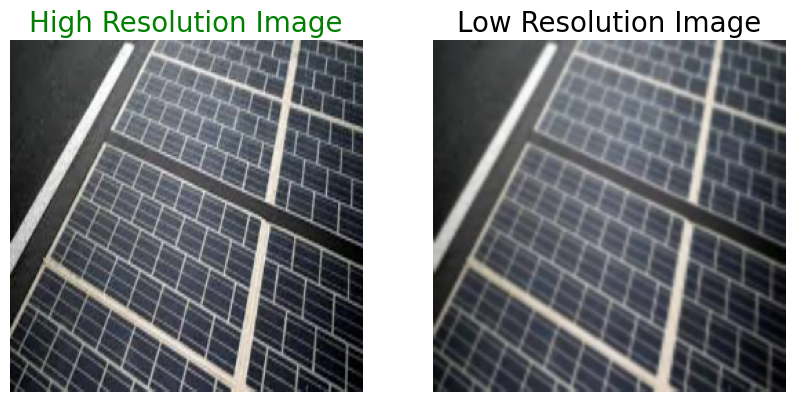

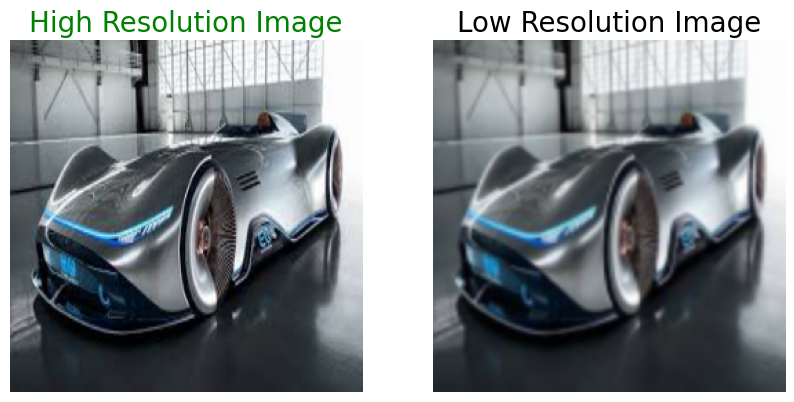

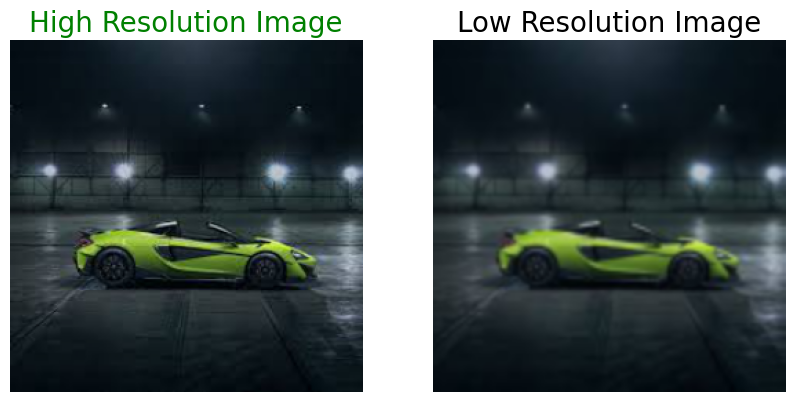

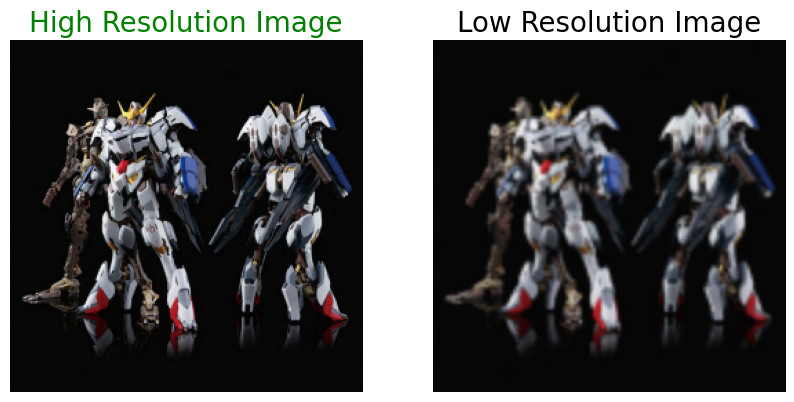

In [9]:
for i in range(4):
    a = np.random.randint(0, 855)
    fig, axs = plt.subplots(1, 2, figsize=(10, 10))

    axs[0].imshow(high_img[a])
    axs[0].set_title('High Resolution Image', color='green', fontsize=20)
    axs[0].set_xlabel('X-axis')
    axs[0].set_ylabel('Y-axis')
    axs[0].axis('off')

    axs[1].imshow(low_img[a])
    axs[1].set_title('Low Resolution Image', color='black', fontsize=20)
    axs[1].set_xlabel('X-axis')
    axs[1].set_ylabel('Y-axis')
    axs[1].axis('off')

    plt.show()


***Slicing images***

In [10]:
train_high_image = high_img[:598] # 598 images in train set
train_low_image = low_img[:598]

validation_high_image = high_img[598:725]   #127 images in validation set
validation_low_image = low_img[598:725]

test_high_image = high_img[725:] #130 images in test set
test_low_image = low_img[725:]

***Reshaping Images***

In [11]:
train_high_image = np.reshape(train_high_image,(len(train_high_image),SIZE,SIZE,3))
train_low_image = np.reshape(train_low_image,(len(train_low_image),SIZE,SIZE,3))

validation_high_image= np.reshape(validation_high_image,(len(validation_high_image),SIZE,SIZE,3))
validation_low_image = np.reshape(validation_low_image,(len(validation_low_image),SIZE,SIZE,3))

test_high_image= np.reshape(test_high_image,(len(test_high_image),SIZE,SIZE,3))
test_low_image = np.reshape(test_low_image,(len(test_low_image),SIZE,SIZE,3))

***Shape of train, test and validation images***

In [12]:
print("Training set:",train_high_image.shape)
print("Test set:",test_high_image.shape)
print("Validation set:",validation_high_image.shape)

Training set: (598, 256, 256, 3)
Test set: (130, 256, 256, 3)
Validation set: (127, 256, 256, 3)


The model consists of downsample and upsample blocks, which are commonly used in convolutional neural networks (CNNs) for image processing tasks.

Downsampling is performed using Conv2D layers with a stride of 2, which reduces the spatial dimensions of the input feature maps and helps capture high level features from larger receptive fields. The downsample blocks also incorporate LeakyReLU activation and optional BatchNormalization.

Upsampling is achieved using Conv2DTranspose layers, which increase the spatial dimensions of the feature maps while reducing the number of channels. Upsampling helps recover spatial details lost during the downsampling process and refine the generated output. The upsample blocks also include LeakyReLU activation and optional dropout, which helps prevent overfitting and enhance the generalization ability of the model.

By combining downsampling and upsampling operations, model captures both low level and high-level features and this allows model to generate output preserving even minute spatial details from larger perceptive fields.

I have used strides here and have not used MaxPooling because when I researched both strides and pooling seem to have the same purpose of reducing spatial dimensions of a feature maps in a CNN so I want to work on strides as I have never used it before.

***Defining a Sequential model***

In [16]:
from keras import layers
from keras.layers import Input, Conv2D, Concatenate
#from keras.activations import tanh
from keras.models import Model
from keras.callbacks import LearningRateScheduler

def down(filters, kernel_size, apply_batch_normalization=True):
    downsample = tf.keras.models.Sequential()
    downsample.add(layers.Conv2D(filters, kernel_size, padding='same', strides=2))
    if apply_batch_normalization:
        downsample.add(layers.BatchNormalization())
    downsample.add(layers.LeakyReLU())
    return downsample


def up(filters, kernel_size, dropout=False):
    upsample = tf.keras.models.Sequential()
    upsample.add(layers.Conv2DTranspose(filters, kernel_size, padding='same', strides=2))
    if dropout:
        upsample.add(layers.Dropout(0.2))
    upsample.add(layers.LeakyReLU())
    return upsample

def model():
    inputs = layers.Input(shape=[SIZE, SIZE, 3])

    d1 = down(128, (3, 3), apply_batch_normalization=False)(inputs)
    d2 = down(128, (3, 3), apply_batch_normalization=False)(d1)
    d3 = down(256, (3, 3), apply_batch_normalization=True)(d2)
    d4 = down(512, (3, 3), apply_batch_normalization=True)(d3)
    d5 = down(512, (3, 3), apply_batch_normalization=True)(d4)

    u1 = up(512, (3, 3), dropout=False)(d5)
    u1 = layers.concatenate([u1, d4])
    u2 = up(256, (3, 3), dropout=False)(u1)
    u2 = layers.concatenate([u2, d3])
    u3 = up(128, (3, 3), dropout=False)(u2)
    u3 = layers.concatenate([u3, d2])
    u4 = up(128, (3, 3), dropout=False)(u3)
    u4 = layers.concatenate([u4, d1])
    u5 = up(3, (3, 3), dropout=False)(u4)
    u5 = layers.concatenate([u5, inputs])

    output = layers.Conv2D(3, (2, 2), strides=1, padding='same')(u5)
    return tf.keras.Model(inputs=inputs, outputs=output)

model = model()
model.summary()


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 sequential (Sequential)        (None, 128, 128, 12  3584        ['input_1[0][0]']                
                                8)                                                                
                                                                                                  
 sequential_1 (Sequential)      (None, 64, 64, 128)  147584      ['sequential[0][0]']             
                                                                                              

***Learning Rate Optimization by using learning rate scheduler***

In [17]:
# Define a learning rate schedule function
def lr_schedule(epoch):
    learning_rate = 0.001
    if epoch > 5:
        learning_rate *= 0.1
    return learning_rate

# Create a learning rate scheduler callback
lr_scheduler = LearningRateScheduler(lr_schedule)

***Compile the model***

In [18]:
model.compile(optimizer = 'adam', loss = 'mean_absolute_error',
              metrics = ['acc'])

***Fitting the model***

In [21]:
#fit the model to the training data
history = model.fit(train_low_image, train_high_image, epochs = 10, batch_size = 32,
          validation_data = (validation_low_image,validation_high_image), verbose=1, callbacks=[lr_scheduler])

Epoch 1/10
19/19 [==============================] - 500s 26s/step - loss: 0.3989 - acc: 0.5107 - val_loss: 0.3456 - val_acc: 0.5130 - lr: 0.0010
Epoch 2/10
19/19 [==============================] - 450s 24s/step - loss: 0.2321 - acc: 0.6199 - val_loss: 0.1997 - val_acc: 0.4465 - lr: 0.0010
Epoch 3/10
19/19 [==============================] - 454s 24s/step - loss: 0.0857 - acc: 0.5021 - val_loss: 0.0870 - val_acc: 0.4752 - lr: 0.0010
Epoch 4/10
19/19 [==============================] - 448s 24s/step - loss: 0.0639 - acc: 0.5872 - val_loss: 0.0883 - val_acc: 0.3325 - lr: 0.0010
Epoch 5/10
19/19 [==============================] - 444s 24s/step - loss: 0.0547 - acc: 0.6061 - val_loss: 0.0643 - val_acc: 0.4442 - lr: 0.0010
Epoch 6/10
19/19 [==============================] - 445s 24s/step - loss: 0.0497 - acc: 0.6290 - val_loss: 0.0523 - val_acc: 0.6193 - lr: 0.0010
Epoch 7/10
19/19 [==============================] - 454s 24s/step - loss: 0.0446 - acc: 0.6634 - val_loss: 0.0484 - val_acc: 0.630

In [22]:
# Use this bit of code to view the History output.
import pandas as pd
hist = pd.DataFrame(history.history)
print(hist.tail())

       loss       acc  val_loss   val_acc      lr
5  0.049721  0.628970  0.052253  0.619323  0.0010
6  0.044631  0.663422  0.048365  0.630641  0.0001
7  0.043249  0.672353  0.048994  0.587274  0.0001
8  0.042701  0.673061  0.046654  0.628535  0.0001
9  0.042180  0.680210  0.045280  0.654919  0.0001


***Plotting accuracy/loss vs epochs***

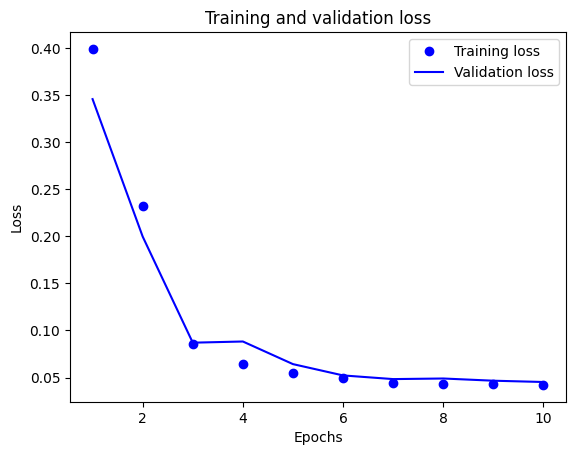

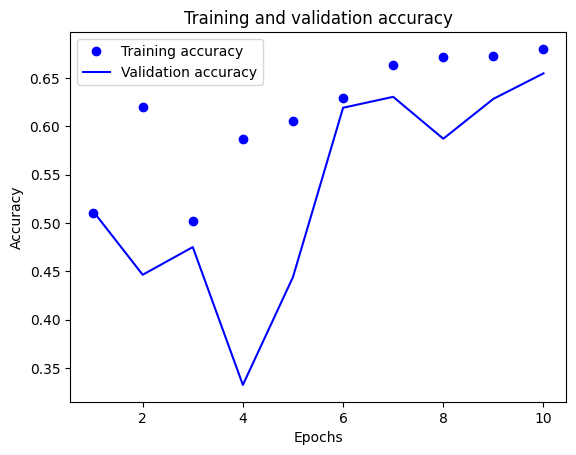

In [23]:
# Let's plot the Loss vs Epochs and Accuracy vs Epochs
import matplotlib.pyplot as plt
history_dict = history.history
loss_values = history_dict['loss']
val_loss_values = history_dict['val_loss']
acc_values = history_dict['acc']
val_acc_values = history_dict['val_acc']
epochs = range(1, len(history_dict['acc']) + 1)


plt.plot(epochs, loss_values, 'bo', label = 'Training loss')
plt.plot(epochs, val_loss_values, 'b', label = 'Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

plt.plot(epochs, acc_values, 'bo', label = 'Training accuracy')
plt.plot(epochs, val_acc_values, 'b', label = 'Validation accuracy')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

***Evaluating the model using test data***

In [15]:
results = model.evaluate(test_low_image, test_high_image)
print(model.metrics_names)
print(results)

5/5 [==============================] - 37s 7s/step - loss: 0.0444 - acc: 0.6805
['loss', 'acc']
[0.04444568604230881, 0.6804841160774231]


***Visualizing predicted high resolution images***

1/1 [==============================] - 1s 529ms/step


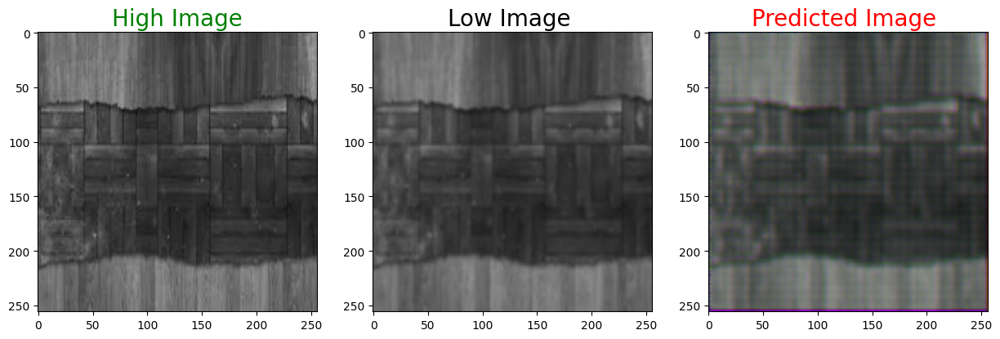

1/1 [==============================] - 0s 449ms/step


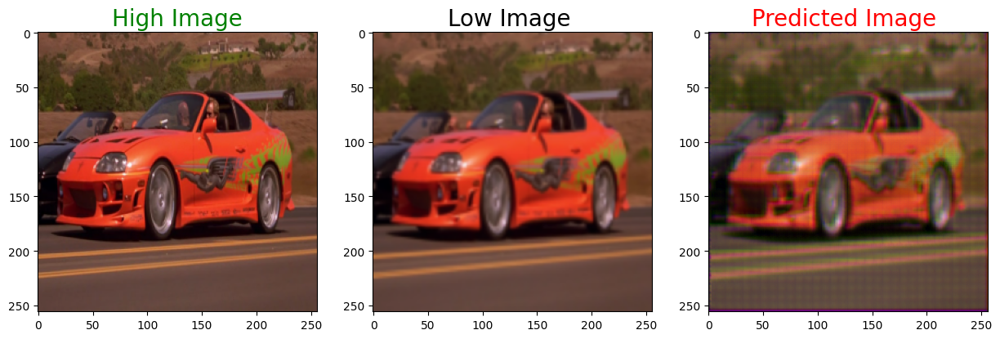

1/1 [==============================] - 0s 467ms/step


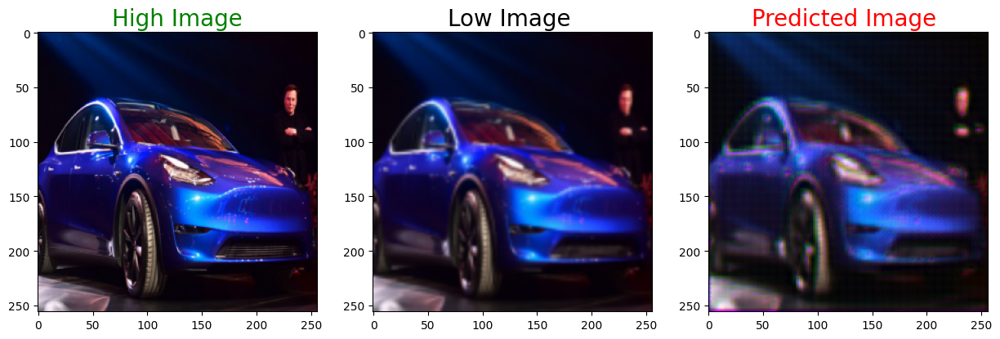

1/1 [==============================] - 0s 450ms/step


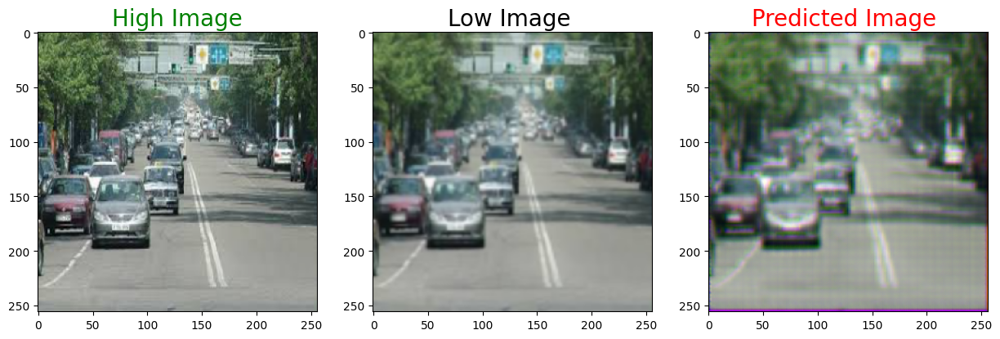

1/1 [==============================] - 0s 413ms/step


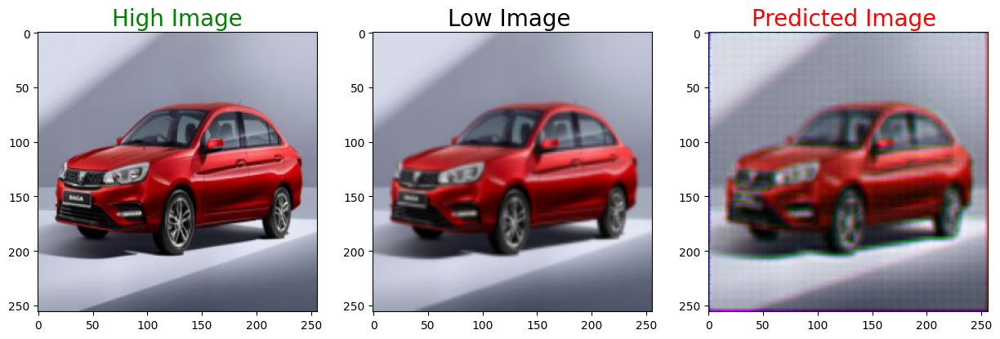

1/1 [==============================] - 0s 334ms/step


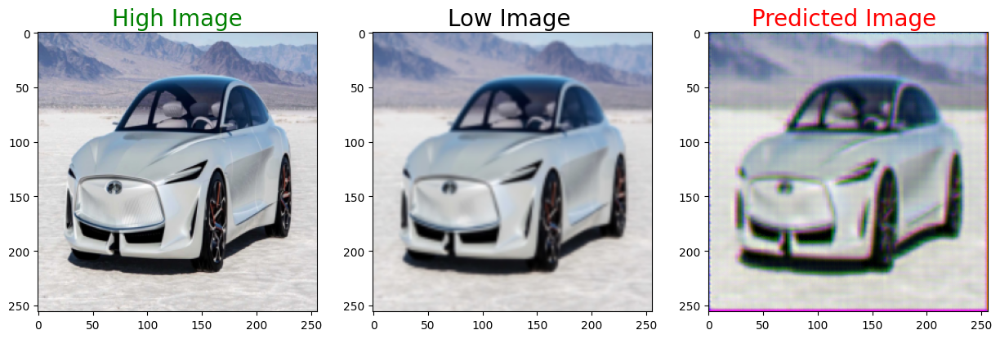

1/1 [==============================] - 0s 366ms/step


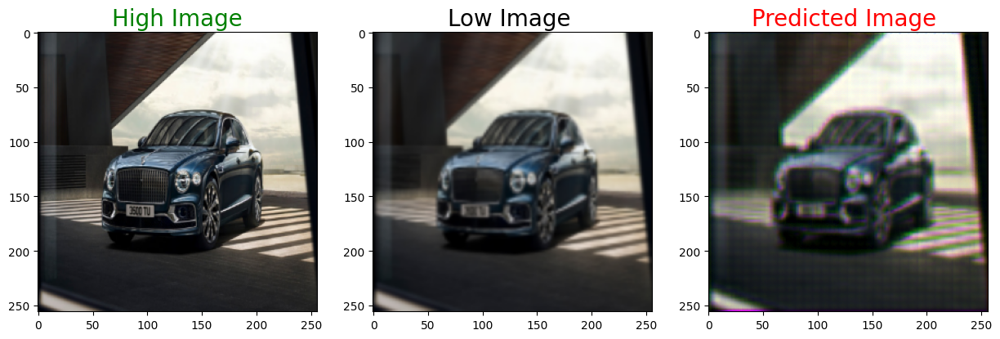

1/1 [==============================] - 0s 407ms/step


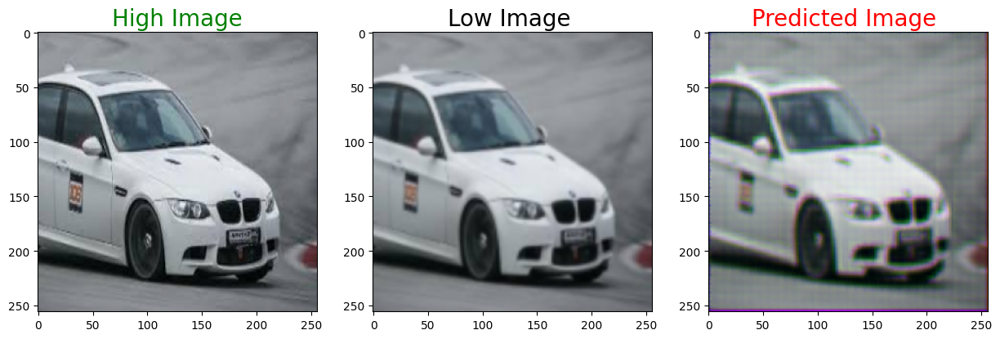

1/1 [==============================] - 0s 333ms/step


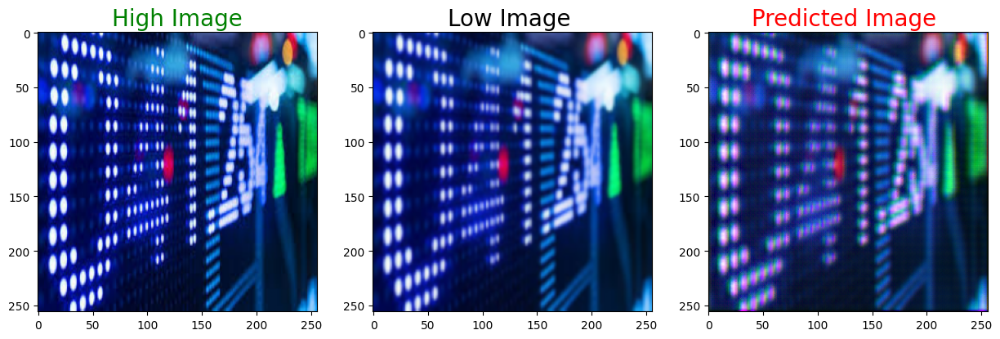

In [16]:
def plot_images(high,low,predicted):
    plt.figure(figsize=(15,15))
    plt.subplot(1,3,1)
    plt.title('High Image', color = 'green', fontsize = 20)
    plt.imshow(high)
    plt.subplot(1,3,2)
    plt.title('Low Image ', color = 'black', fontsize = 20)
    plt.imshow(low)
    plt.subplot(1,3,3)
    plt.title('Predicted Image ', color = 'Red', fontsize = 20)
    plt.imshow(predicted)

    plt.show()

for i in range(1,10):

    predicted = np.clip(model.predict(test_low_image[i].reshape(1,SIZE, SIZE,3)),0.0,1.0).reshape(SIZE, SIZE,3)
    plot_images(test_high_image[i],test_low_image[i],predicted)

Other than accuracy and visualizing the predicted images, also trying to get more insights of the quality and similarity of the generated high resolution images with the ground true high resolution images using metrics such as ssim (Structural similarity Index) and psnr(Peak Signal-to-Noise Ratio).

***Calculating SSIM(Structural similarity index) and PSNR(Peak Signal-to-noise Ratio)***

In [28]:
import numpy as np
import tensorflow as tf
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.transform import resize

# generated high-resolution images: predicted2
# ground truth high-resolution images: test_high_image

# Calculate SSIM, PSNR for each generated and ground truth image
ssim_scores = []
psnr_scores = []

for i in range(len(predicted)):
    if i < len(test_high_image):
        predicted_image = predicted[i]
        test_high = test_high_image[i]

        # Resize images to the same dimensions
        predicted_resized = resize(predicted_image, test_high.shape, anti_aliasing=True)

        # Calculate SSIM
        ssim_score = ssim(predicted_resized, test_high, channel_axis=2)
        ssim_scores.append(ssim_score)

        # Calculate PSNR
        mse = np.mean((predicted_resized - test_high) ** 2)
        max_pixel = np.max(predicted_resized)
        psnr_score = 20 * np.log10(max_pixel) - 10 * np.log10(mse)
        psnr_scores.append(psnr_score)


        predicted_tensor = tf.convert_to_tensor(predicted_resized[np.newaxis, ...], dtype=tf.float32)
        test_high_tensor = tf.convert_to_tensor(test_high[np.newaxis, ...], dtype=tf.float32)

# Compute the average scores
average_ssim = sum(ssim_scores) / len(ssim_scores)
average_psnr = sum(psnr_scores) / len(psnr_scores)


# Print the average scores
print("Average SSIM:", average_ssim)
print("Average PSNR:", average_psnr)

Average SSIM: 0.26298250641960363
Average PSNR: 8.795907645714369


Based on these scores, it is understood that there is room for improvement in the conversion of low-resolution images to high-resolution images. Further optimization of the model or training process may be necessary to enhance the quality and similarity of the generated images to the ground true high resolution images. Visual inspection of the generated images can also provide additional insights about their quality and whether they appear realistic and detailed. After seeing both, I still feel there is some things which can be added and experimented with like a functional API model with convolutional layers, learning rate optimization using schedulers, batch size, epochs, batch normalization, dropout, activation function, loss, optimizers and transfer learning with or without trainable parameters.

***Save the model***

In [29]:
#save the model
model.save("model.h5")

In [13]:
from keras.models import load_model

# Load the saved model if required
model = load_model('model.h5')

In [31]:
# Clear session
from keras import backend
backend.clear_session()

***Defining a Functional API model***

In [32]:
from keras import layers
from keras.layers import Input, Conv2D, Conv2DTranspose, Concatenate
from keras.callbacks import LearningRateScheduler
from keras.activations import tanh
from keras.models import Model

def down(inputs, filters, kernel_size, apply_batch_normalization=True):
    downsample = Conv2D(filters, kernel_size, padding='same', strides=2)(inputs)
    if apply_batch_normalization:
        downsample = layers.BatchNormalization()(downsample)
    downsample = layers.LeakyReLU()(downsample)
    return downsample

def up(inputs, filters, kernel_size, dropout=False):
    upsample = Conv2DTranspose(filters, kernel_size, padding='same', strides=2)(inputs)
    if dropout:
        upsample = layers.Dropout(0.2)(upsample)
    upsample = layers.LeakyReLU()(upsample)
    return upsample

# Define input layer
inputs = Input(shape=[SIZE, SIZE, 3])

# Define downsample layers
d1 = down(inputs, 128, (3, 3), apply_batch_normalization=False)
d2 = down(d1, 128, (3, 3), apply_batch_normalization=False)
d3 = down(d2, 256, (3, 3), apply_batch_normalization=True)
d4 = down(d3, 512, (3, 3), apply_batch_normalization=True)
d5 = down(d4, 512, (3, 3), apply_batch_normalization=True)

# Define upsample layers
u1 = up(d5, 512, (3, 3), dropout=True)
u1 = Concatenate()([u1, d4])
u2 = up(u1, 256, (3, 3), dropout=False)
u2 = Concatenate()([u2, d3])
u3 = up(u2, 128, (3, 3), dropout=True)
u3 = Concatenate()([u3, d2])
u4 = up(u3, 128, (3, 3), dropout=False)
u4 = Concatenate()([u4, d1])
u5 = up(u4, 3, (3, 3), dropout=False)
u5 = Concatenate()([u5, inputs])

# Define output layer with tanh activation function
output = Conv2D(3, (2, 2), strides=1, padding='same', activation=tanh)(u5)

# Create the model
model1 = Model(inputs=inputs, outputs=output)
model1.summary()


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 128, 128, 12  3584        ['input_1[0][0]']                
                                8)                                                                
                                                                                                  
 leaky_re_lu (LeakyReLU)        (None, 128, 128, 12  0           ['conv2d[0][0]']                 
                                8)                                                            

Below, initial_learning_rate for the first 5 epochs, then reduced by a factor of 10 for epochs 5 to 9, and further reduced by a factor of 10 for epochs 10 and beyond.

***Learning Rate Optimization***

In [33]:
# Define a learning rate schedule function
def lr_schedule(epoch):
    initial_learning_rate = 0.001
    if epoch < 5:
        learning_rate = initial_learning_rate
    elif epoch < 10:
        learning_rate = initial_learning_rate * 0.1
    else:
        learning_rate = initial_learning_rate * 0.01
    return learning_rate


# Create a learning rate scheduler callback
lr_scheduler = LearningRateScheduler(lr_schedule)

#compile the model
model1.compile(optimizer = 'adam', loss = 'mean_squared_error',
              metrics = ['acc'])


***Training the model***

In [34]:
#fit the model to the training data
history = model1.fit(train_low_image, train_high_image, epochs = 15, batch_size = 64,
          validation_data = (validation_low_image,validation_high_image), callbacks=[lr_scheduler])

Epoch 1/15
10/10 [==============================] - 468s 46s/step - loss: 0.1475 - acc: 0.3092 - val_loss: 0.3312 - val_acc: 0.4153 - lr: 0.0010
Epoch 2/15
10/10 [==============================] - 448s 45s/step - loss: 0.0451 - acc: 0.3008 - val_loss: 0.2796 - val_acc: 0.3427 - lr: 0.0010
Epoch 3/15
10/10 [==============================] - 446s 45s/step - loss: 0.0220 - acc: 0.3729 - val_loss: 0.1996 - val_acc: 0.4096 - lr: 0.0010
Epoch 4/15
10/10 [==============================] - 447s 45s/step - loss: 0.0114 - acc: 0.5907 - val_loss: 0.1279 - val_acc: 0.4351 - lr: 0.0010
Epoch 5/15
10/10 [==============================] - 439s 44s/step - loss: 0.0080 - acc: 0.6490 - val_loss: 0.1164 - val_acc: 0.4825 - lr: 0.0010
Epoch 6/15
10/10 [==============================] - 449s 45s/step - loss: 0.0076 - acc: 0.6819 - val_loss: 0.0396 - val_acc: 0.5700 - lr: 1.0000e-04
Epoch 7/15
10/10 [==============================] - 446s 45s/step - loss: 0.0070 - acc: 0.6792 - val_loss: 0.0432 - val_acc: 0

In [35]:
# Use this bit of code to view the History output.
import pandas as pd
hist = pd.DataFrame(history.history)
print(hist.tail())

        loss       acc  val_loss   val_acc       lr
10  0.006491  0.706753  0.017509  0.653205  0.00001
11  0.006458  0.707701  0.014699  0.661796  0.00001
12  0.006431  0.707658  0.013285  0.667226  0.00001
13  0.006398  0.708450  0.012277  0.671564  0.00001
14  0.006410  0.709269  0.011267  0.675968  0.00001


***Plot accuracy/loss vs epochs***

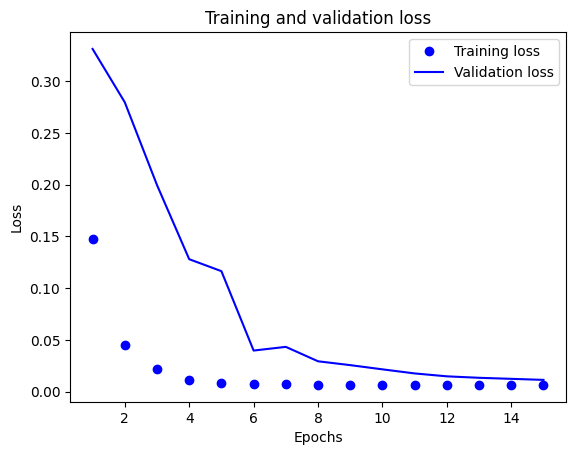

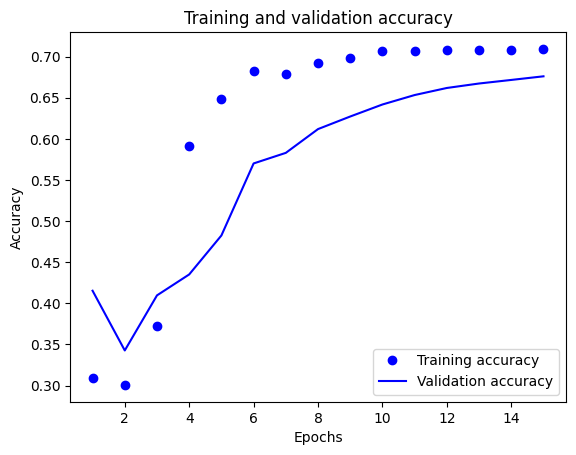

In [36]:
# Let's plot the Loss vs Epochs and Accuracy vs Epochs
import matplotlib.pyplot as plt
history_dict = history.history
loss_values = history_dict['loss']
val_loss_values = history_dict['val_loss']
acc_values = history_dict['acc']
val_acc_values = history_dict['val_acc']
epochs = range(1, len(history_dict['acc']) + 1)


plt.plot(epochs, loss_values, 'bo', label = 'Training loss')
plt.plot(epochs, val_loss_values, 'b', label = 'Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

plt.plot(epochs, acc_values, 'bo', label = 'Training accuracy')
plt.plot(epochs, val_acc_values, 'b', label = 'Validation accuracy')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

***Evaluating model on test data***

In [37]:
results1 = model1.evaluate(test_low_image, test_high_image)
print(model1.metrics_names)
print(results1)

5/5 [==============================] - 34s 6s/step - loss: 0.0103 - acc: 0.7246
['loss', 'acc']
[0.010337373241782188, 0.7245703935623169]


***Visualizing predicted high resolution image***

1/1 [==============================] - 1s 513ms/step


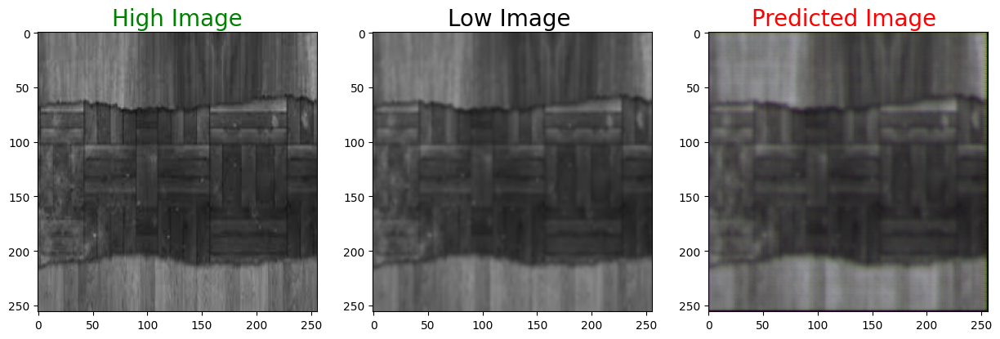

1/1 [==============================] - 0s 263ms/step


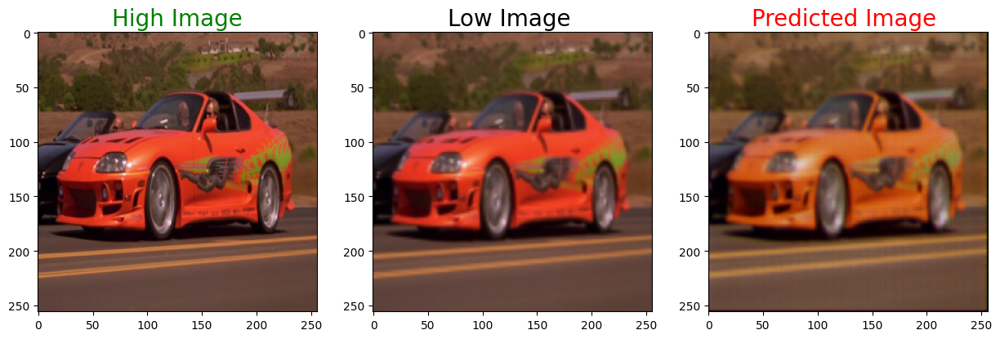

1/1 [==============================] - 0s 305ms/step


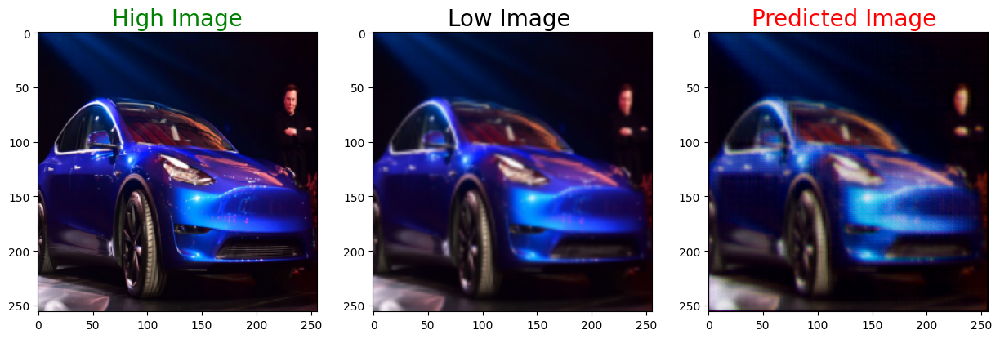

1/1 [==============================] - 0s 261ms/step


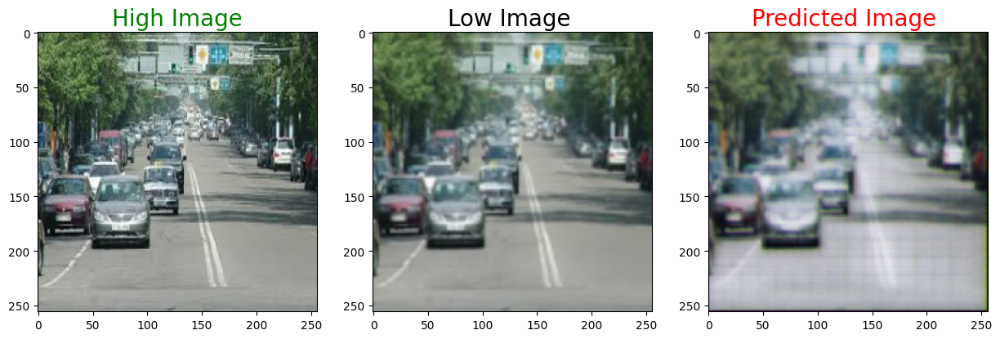

1/1 [==============================] - 0s 350ms/step


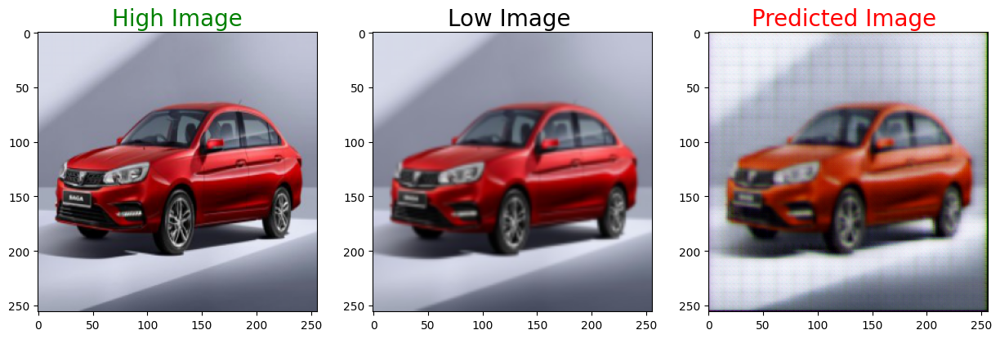

1/1 [==============================] - 0s 408ms/step


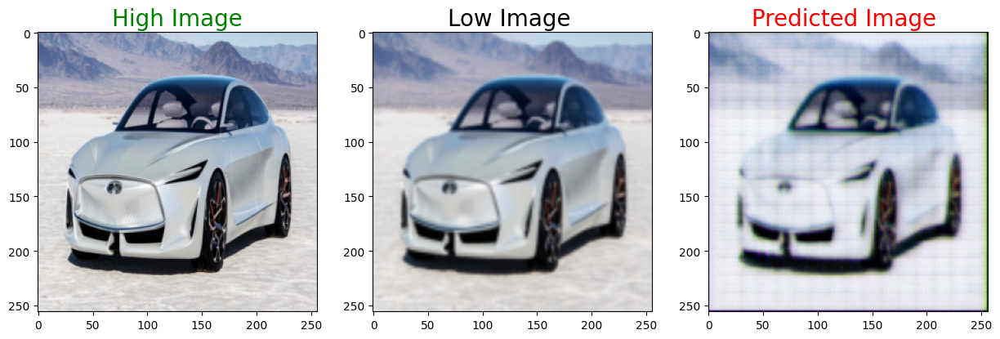

1/1 [==============================] - 0s 415ms/step


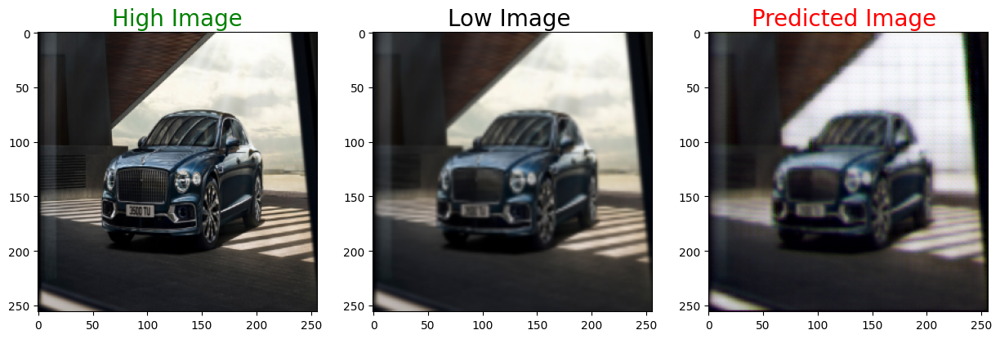

1/1 [==============================] - 0s 297ms/step


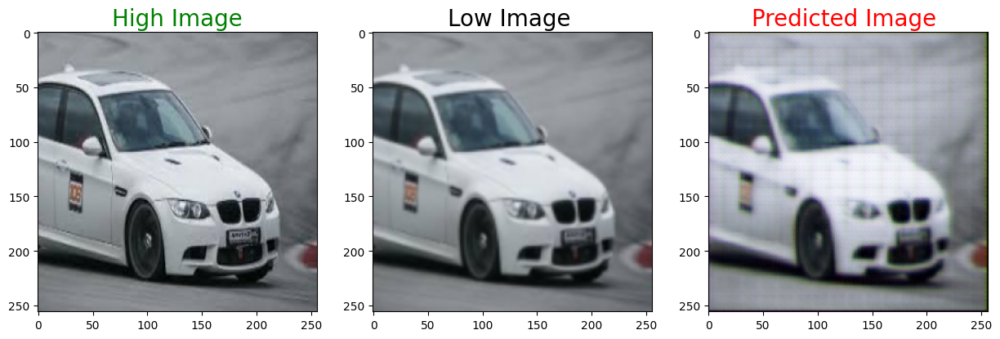

1/1 [==============================] - 0s 282ms/step


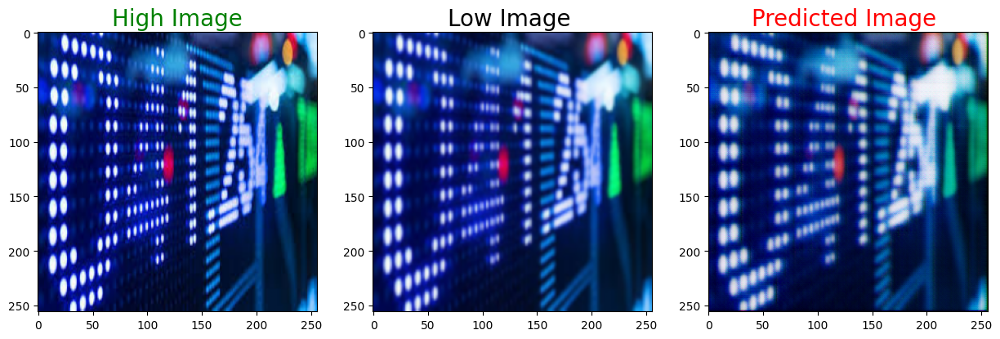

In [38]:
def plot_images(high,low,predicted1):
    plt.figure(figsize=(15,15))
    plt.subplot(1,3,1)
    plt.title('High Image', color = 'green', fontsize = 20)
    plt.imshow(high)
    plt.subplot(1,3,2)
    plt.title('Low Image ', color = 'black', fontsize = 20)
    plt.imshow(low)
    plt.subplot(1,3,3)
    plt.title('Predicted Image ', color = 'Red', fontsize = 20)
    plt.imshow(predicted1)

    plt.show()

for i in range(1,10):

    predicted1 = np.clip(model1.predict(test_low_image[i].reshape(1,SIZE, SIZE,3)),0.0,1.0).reshape(SIZE, SIZE,3)
    plot_images(test_high_image[i],test_low_image[i],predicted1)

***Calculating SSIM(Structural similarity index) and PSNR(Peak Signal-to-noise Ratio)***

In [44]:
import numpy as np
import tensorflow as tf
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.transform import resize

# generated high-resolution images: predicted2
# ground truth high-resolution images: test_high_image

# Calculate SSIM, PSNR for each generated and ground truth image
ssim_scores = []
psnr_scores = []

for i in range(len(predicted1)):
    if i < len(test_high_image):
        predicted_image = predicted1[i]
        test_high = test_high_image[i]

        # Resize images to the same dimensions
        predicted_resized = resize(predicted_image, test_high.shape, anti_aliasing=True)

        # Calculate SSIM
        ssim_score = ssim(predicted_resized, test_high, channel_axis=2)
        ssim_scores.append(ssim_score)

        # Calculate PSNR
        mse = np.mean((predicted_resized - test_high) ** 2)
        max_pixel = np.max(predicted_resized)
        psnr_score = 20 * np.log10(max_pixel) - 10 * np.log10(mse)
        psnr_scores.append(psnr_score)

        # Calculate perceptual loss
        predicted_tensor = tf.convert_to_tensor(predicted_resized[np.newaxis, ...], dtype=tf.float32)
        test_high_tensor = tf.convert_to_tensor(test_high[np.newaxis, ...], dtype=tf.float32)


# Compute the average scores
average_ssim = sum(ssim_scores) / len(ssim_scores)
average_psnr = sum(psnr_scores) / len(psnr_scores)


# Print the average scores
print("Average SSIM:", average_ssim)
print("Average PSNR:", average_psnr)


Average SSIM: 0.2395262867785417
Average PSNR: 7.7259470189276795


***Save the model***

In [45]:
model1.save("model1.h5")

***Load the model(if required for future use)***

In [ ]:
from keras.models import load_model
# Load the saved model
model1 = load_model('model1.h5')

In [46]:
#clear session
backend.clear_session()

***VGG16 Model***

In [19]:
from keras.applications import VGG16
from keras import layers
from keras.layers import Input, Conv2D, Conv2DTranspose, Concatenate, Activation
from keras.models import Model

def down(inputs, filters, kernel_size, apply_batch_normalization=True):
    downsample = Conv2D(filters, kernel_size, padding='same', strides=2)(inputs)
    if apply_batch_normalization:
        downsample = layers.BatchNormalization()(downsample)
    downsample = layers.ReLU()(downsample)
    return downsample

def up(inputs, filters, kernel_size, dropout=False):
    upsample = Conv2DTranspose(filters, kernel_size, padding='same', strides=2)(inputs)
    if dropout:
        upsample = layers.Dropout(0.2)(upsample)
    upsample = layers.ReLU()(upsample)
    return upsample

# Define input layer
inputs = Input(shape=[SIZE, SIZE, 3])

# Define VGG model
vgg = VGG16(include_top=False, weights='imagenet', input_tensor=inputs)
vgg.trainable = False
vgg_output = vgg.get_layer('block4_conv3').output

# Define downsample layers
d1 = down(inputs, 128, (3, 3), apply_batch_normalization=False)
d2 = down(d1, 128, (3, 3), apply_batch_normalization=False)
d3 = down(d2, 256, (3, 3), apply_batch_normalization=True)
d4 = down(d3, 512, (3, 3), apply_batch_normalization=True)
d5 = down(d4, 512, (3, 3), apply_batch_normalization=True)

# Define upsample layers
u1 = up(d5, 512, (3, 3), dropout=False)
u1 = Concatenate()([u1, d4])
u2 = up(u1, 256, (3, 3), dropout=True)
u2 = Concatenate()([u2, d3])
u3 = up(u2, 128, (3, 3), dropout=False)
u3 = Concatenate()([u3, d2])
u4 = up(u3, 128, (3, 3), dropout=False)
u4 = Concatenate()([u4, d1])
u5 = up(u4, 3, (3, 3), dropout=False)
u5_resized = Conv2D(3, (1, 1), padding='same')(u5)

# Resize vgg_output to match the spatial dimensions of u5_resized
vgg_output_resized = Conv2DTranspose(3, (32, 32), padding='same', strides=8)(vgg_output)

# Apply activation to the output of the upsampling layers
u5_resized = Activation('relu')(u5_resized)

# Combine the resized u5 and the resized vgg_output
combined_output = Concatenate()([vgg_output_resized, u5_resized])

# Define output layer with sigmoid activation function
output = Conv2D(3, (2, 2), strides=1, padding='same', activation='sigmoid')(combined_output)

# Create the model
model2 = Model(inputs=inputs, outputs=output)
model2.summary()


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_1 (Conv2D)              (None, 128, 128, 12  3584        ['input_2[0][0]']                
                                8)                                                                
                                                                                                  
 re_lu (ReLU)                   (None, 128, 128, 12  0           ['conv2d_1[0][0]']               
                                8)                                                            

***Learning Rate Optimization using scheduler***

In [21]:
# Define a learning rate schedule function
from keras.callbacks import LearningRateScheduler
def lr_schedule(epoch):
    initial_learning_rate = 0.0001
    if epoch < 5:
        learning_rate = initial_learning_rate
    elif epoch < 10:
        learning_rate = initial_learning_rate * 0.01
    else:
        learning_rate = initial_learning_rate * 0.1
    return learning_rate


# Create a learning rate scheduler callback
lr_scheduler = LearningRateScheduler(lr_schedule)

#compile the model
model2.compile(optimizer = 'rmsprop', loss = 'mean_absolute_error',
              metrics = ['acc'])

***Fitting the model***

In [22]:
#fit the model to the training data
history = model2.fit(train_low_image, train_high_image, epochs = 20, batch_size = 1,
          validation_data = (validation_low_image,validation_high_image), callbacks=[lr_scheduler])

Epoch 1/20
598/598 [==============================] - 1133s 2s/step - loss: 0.2134 - acc: 0.3378 - val_loss: 0.1871 - val_acc: 0.3816 - lr: 1.0000e-04
Epoch 2/20
598/598 [==============================] - 1118s 2s/step - loss: 0.1654 - acc: 0.3408 - val_loss: 0.1445 - val_acc: 0.3849 - lr: 1.0000e-04
Epoch 3/20
598/598 [==============================] - 1131s 2s/step - loss: 0.1301 - acc: 0.3460 - val_loss: 0.1192 - val_acc: 0.3869 - lr: 1.0000e-04
Epoch 4/20
598/598 [==============================] - 1130s 2s/step - loss: 0.1087 - acc: 0.3785 - val_loss: 0.1023 - val_acc: 0.4408 - lr: 1.0000e-04
Epoch 5/20
598/598 [==============================] - 1105s 2s/step - loss: 0.0939 - acc: 0.4098 - val_loss: 0.0920 - val_acc: 0.4921 - lr: 1.0000e-04
Epoch 6/20
598/598 [==============================] - 1134s 2s/step - loss: 0.0865 - acc: 0.4386 - val_loss: 0.0890 - val_acc: 0.4638 - lr: 1.0000e-06
Epoch 7/20
598/598 [==============================] - 1124s 2s/step - loss: 0.0860 - acc: 0.43

In [24]:
# Use this bit of code to view the History output.
import pandas as pd
hist = pd.DataFrame(history.history)
print(hist.tail())

        loss       acc  val_loss   val_acc       lr
15  0.080624  0.445471  0.082889  0.470173  0.00001
16  0.079844  0.448020  0.082399  0.479079  0.00001
17  0.079075  0.452134  0.081655  0.475895  0.00001
18  0.078387  0.453701  0.080858  0.477504  0.00001
19  0.077739  0.456780  0.079919  0.470039  0.00001


***Plot accuracy/loss vs epochs***

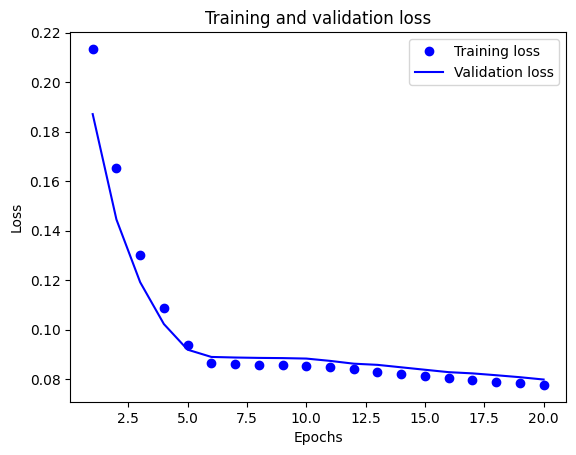

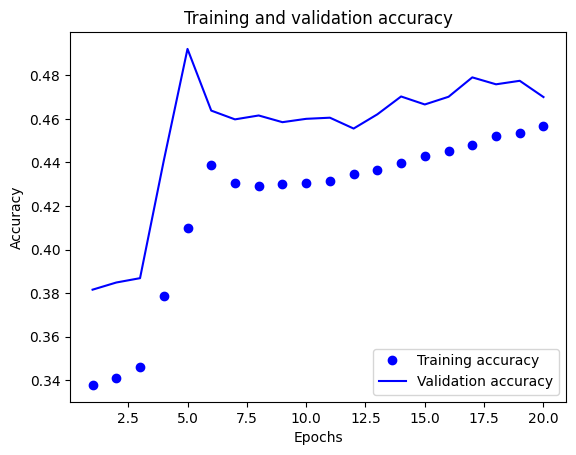

In [25]:
# Let's plot the Loss vs Epochs and Accuracy vs Epochs
import matplotlib.pyplot as plt
history_dict = history.history
loss_values = history_dict['loss']
val_loss_values = history_dict['val_loss']
acc_values = history_dict['acc']
val_acc_values = history_dict['val_acc']
epochs = range(1, len(history_dict['acc']) + 1)


plt.plot(epochs, loss_values, 'bo', label = 'Training loss')
plt.plot(epochs, val_loss_values, 'b', label = 'Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

plt.plot(epochs, acc_values, 'bo', label = 'Training accuracy')
plt.plot(epochs, val_acc_values, 'b', label = 'Validation accuracy')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

***Evaluate the model***

In [26]:
results2 = model2.evaluate(test_low_image, test_high_image)
print(model2.metrics_names)
print(results2)

5/5 [==============================] - 145s 27s/step - loss: 0.0835 - acc: 0.4499
['loss', 'acc']
[0.08352921158075333, 0.44985127449035645]


***Visualizing predicted images***

1/1 [==============================] - 2s 2s/step


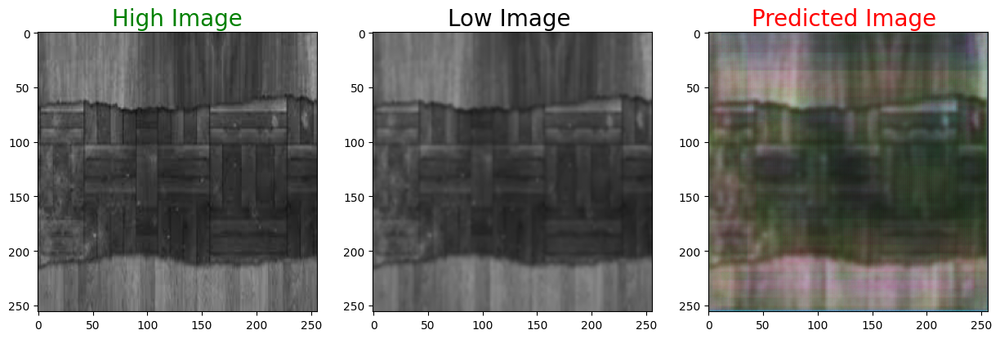

1/1 [==============================] - 2s 2s/step


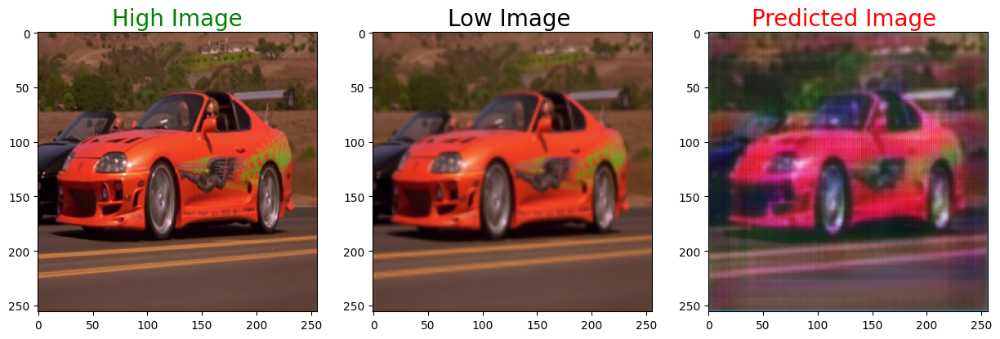

1/1 [==============================] - 1s 1s/step


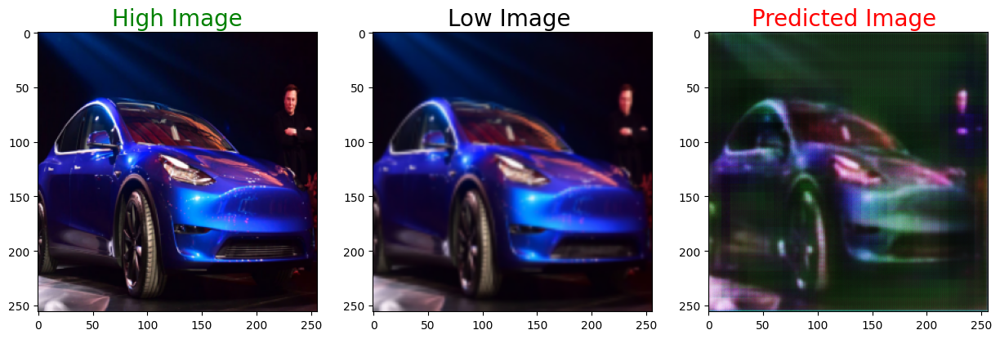

1/1 [==============================] - 1s 1s/step


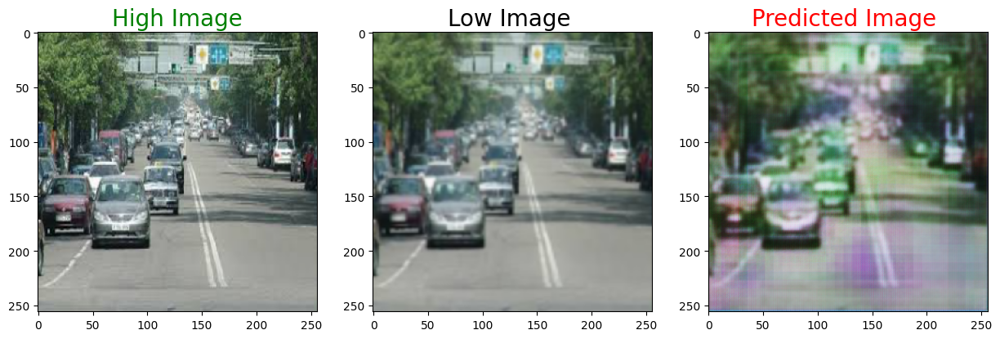

In [27]:
def plot_images(high,low,predicted2):
    plt.figure(figsize=(15,15))
    plt.subplot(1,3,1)
    plt.title('High Image', color = 'green', fontsize = 20)
    plt.imshow(high)
    plt.subplot(1,3,2)
    plt.title('Low Image ', color = 'black', fontsize = 20)
    plt.imshow(low)
    plt.subplot(1,3,3)
    plt.title('Predicted Image ', color = 'Red', fontsize = 20)
    plt.imshow(predicted2)

    plt.show()

for i in range(1,5):

    predicted2 = np.clip(model2.predict(test_low_image[i].reshape(1,SIZE, SIZE,3)),0.0,1.0).reshape(SIZE, SIZE,3)
    plot_images(test_high_image[i],test_low_image[i],predicted2)

***Calculating SSIM(Structural similarity index) and PSNR(Peak Signal-to-noise Ratio)***

In [28]:
import numpy as np
import tensorflow as tf
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.transform import resize

# generated high-resolution images: predicted2
# ground truth high-resolution images: test_high_image

# Calculate SSIM, PSNR for each generated and ground truth image
ssim_scores = []
psnr_scores = []

for i in range(len(predicted2)):
    if i < len(test_high_image):
        predicted_image = predicted2[i]
        test_high = test_high_image[i]

        # Resize images to the same dimensions
        predicted_resized = resize(predicted_image, test_high.shape, anti_aliasing=True)

        # Calculate SSIM
        ssim_score = ssim(predicted_resized, test_high, channel_axis=2)
        ssim_scores.append(ssim_score)

        # Calculate PSNR
        mse = np.mean((predicted_resized - test_high) ** 2)
        max_pixel = np.max(predicted_resized)
        psnr_score = 20 * np.log10(max_pixel) - 10 * np.log10(mse)
        psnr_scores.append(psnr_score)

        predicted_tensor = tf.convert_to_tensor(predicted_resized[np.newaxis, ...], dtype=tf.float32)
        test_high_tensor = tf.convert_to_tensor(test_high[np.newaxis, ...], dtype=tf.float32)

# Compute the average scores
average_ssim = sum(ssim_scores) / len(ssim_scores)
average_psnr = sum(psnr_scores) / len(psnr_scores)

# Print the average scores
print("Average SSIM:", average_ssim)
print("Average PSNR:", average_psnr)


Average SSIM: 0.3455372131787814
Average PSNR: 7.8808737471699715


***Save the model***

In [29]:
model2.save("model2.h5")

***Load the model (if required)***

In [3]:
from keras.models import load_model
# Load the saved model
model2 = load_model('model2.h5')

***VGG16 Model using kernel regularizers***

In [14]:
from keras.applications import VGG16
from keras import layers
from keras.layers import Input, Conv2D, Conv2DTranspose, Concatenate, Activation
from keras.models import Model
from keras.regularizers import l1_l2
from keras.optimizers import Adam

def down(inputs, filters, kernel_size, apply_batch_normalization=True):
    downsample = Conv2D(filters, kernel_size, padding='same', strides=2, kernel_regularizer=l1_l2(l1=0.01, l2=0.01))(inputs)
    if apply_batch_normalization:
        downsample = layers.BatchNormalization()(downsample)
    downsample = layers.ReLU()(downsample)
    return downsample

def up(inputs, filters, kernel_size, dropout=False):
    upsample = Conv2DTranspose(filters, kernel_size, padding='same', strides=2)(inputs)
    upsample = layers.ReLU()(upsample)
    return upsample

# Define input layer
inputs = Input(shape=[SIZE, SIZE, 3])

# Define VGG model
vgg = VGG16(include_top=False, weights='imagenet', input_tensor=inputs)
vgg.trainable = False
vgg_output = vgg.get_layer('block4_conv3').output

# Define downsample layers
d1 = down(inputs, 128, (3, 3), apply_batch_normalization=True)
d2 = down(d1, 128, (3, 3), apply_batch_normalization=True)
d3 = down(d2, 256, (3, 3), apply_batch_normalization=True)
d4 = down(d3, 512, (3, 3), apply_batch_normalization=True)
d5 = down(d4, 512, (3, 3), apply_batch_normalization=True)

# Define upsample layers
u1 = up(d5, 512, (3, 3), dropout=0.2)
u1 = Concatenate()([u1, d4])
u2 = up(u1, 256, (3, 3), dropout=0.3)
u2 = Concatenate()([u2, d3])
u3 = up(u2, 128, (3, 3), dropout=0.4)
u3 = Concatenate()([u3, d2])
u4 = up(u3, 128, (3, 3), dropout=0.5)
u4 = Concatenate()([u4, d1])
u5 = up(u4, 3, (3, 3), dropout=0.6)
u5_resized = Conv2D(3, (1, 1), padding='same')(u5)

# Resize vgg_output to match the spatial dimensions of u5_resized
vgg_output_resized = Conv2DTranspose(3, (32, 32), padding='same', strides=8)(vgg_output)

# Apply activation to the output of the upsampling layers
u5_resized = Activation('relu')(u5_resized)

# Combine the resized u5 and the resized vgg_output
combined_output = Concatenate()([vgg_output_resized, u5_resized])

# Define output layer with sigmoid activation function
output = Conv2D(3, (2, 2), strides=1, padding='same', activation='sigmoid')(combined_output)

# Create the model
model3 = Model(inputs=inputs, outputs=output)
model3.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 128, 128, 12  3584        ['input_1[0][0]']                
                                8)                                                                
                                                                                                  
 batch_normalization (BatchNorm  (None, 128, 128, 12  512        ['conv2d[0][0]']                 
 alization)                     8)                                                            

***Compile the model***

In [18]:
# Set the learning rate
learning_rate = 0.001

# Compile the model with Adam optimizer and define loss as mse
optimizer = Adam(learning_rate=learning_rate)
model3.compile(optimizer=optimizer, loss='mse', metrics = ['acc'])

***Fitting the model***

In [19]:
#fit the model to the training data
history = model3.fit(train_low_image, train_high_image, epochs = 5, batch_size = 32,
          validation_data = (validation_low_image,validation_high_image))

Epoch 1/5
19/19 [==============================] - 1078s 57s/step - loss: 11.5812 - acc: 0.3422 - val_loss: 8.0081 - val_acc: 0.2913
Epoch 2/5
19/19 [==============================] - 1070s 57s/step - loss: 6.0868 - acc: 0.4282 - val_loss: 6.1467 - val_acc: 0.3500
Epoch 3/5
19/19 [==============================] - 1067s 57s/step - loss: 4.5872 - acc: 0.4373 - val_loss: 5.6776 - val_acc: 0.4267
Epoch 4/5
19/19 [==============================] - 1098s 58s/step - loss: 4.5187 - acc: 0.4637 - val_loss: 3.8643 - val_acc: 0.4485
Epoch 5/5
19/19 [==============================] - 1185s 63s/step - loss: 4.4532 - acc: 0.4685 - val_loss: 4.2895 - val_acc: 0.4453


In [20]:
# Use this bit of code to view the History output.
import pandas as pd
hist = pd.DataFrame(history.history)
print(hist.tail())

        loss       acc  val_loss   val_acc
0  11.581184  0.342214  8.008124  0.291341
1   6.086811  0.428200  6.146686  0.349979
2   4.587155  0.437267  5.677581  0.426750
3   4.518673  0.463654  3.864318  0.448476
4   4.453197  0.468528  4.289485  0.445294


***Plot accuracy/loss vs epochs***

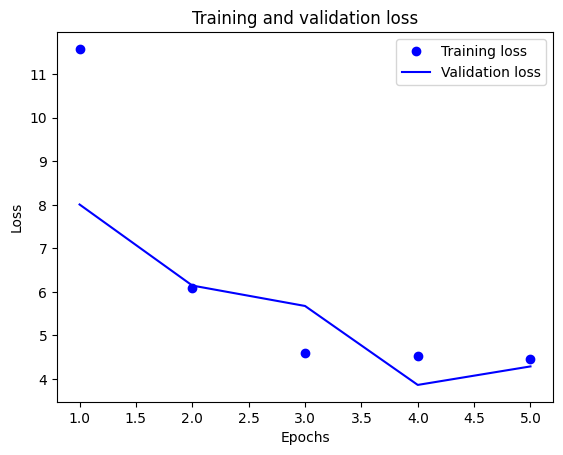

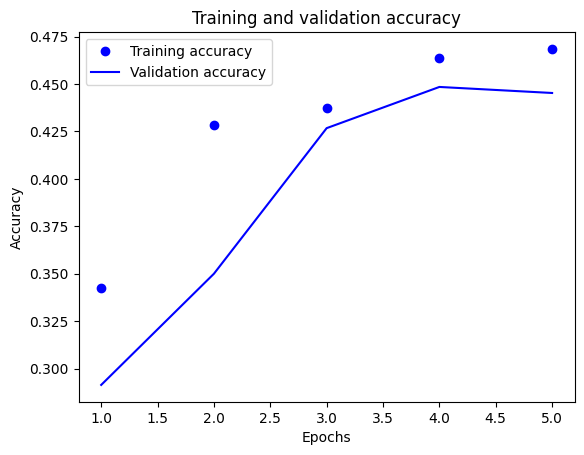

In [21]:
# Let's plot the Loss vs Epochs and Accuracy vs Epochs
import matplotlib.pyplot as plt
history_dict = history.history
loss_values = history_dict['loss']
val_loss_values = history_dict['val_loss']
acc_values = history_dict['acc']
val_acc_values = history_dict['val_acc']
epochs = range(1, len(history_dict['acc']) + 1)


plt.plot(epochs, loss_values, 'bo', label = 'Training loss')
plt.plot(epochs, val_loss_values, 'b', label = 'Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

plt.plot(epochs, acc_values, 'bo', label = 'Training accuracy')
plt.plot(epochs, val_acc_values, 'b', label = 'Validation accuracy')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

***Evaluate the model***

In [22]:
results3 = model3.evaluate(test_low_image, test_high_image)
print(model3.metrics_names)
print(results3)

5/5 [==============================] - 146s 28s/step - loss: 4.2863 - acc: 0.4578
['loss', 'acc']
[4.286274433135986, 0.4577578008174896]


***Visualizing predicted images***

1/1 [==============================] - 1s 1s/step


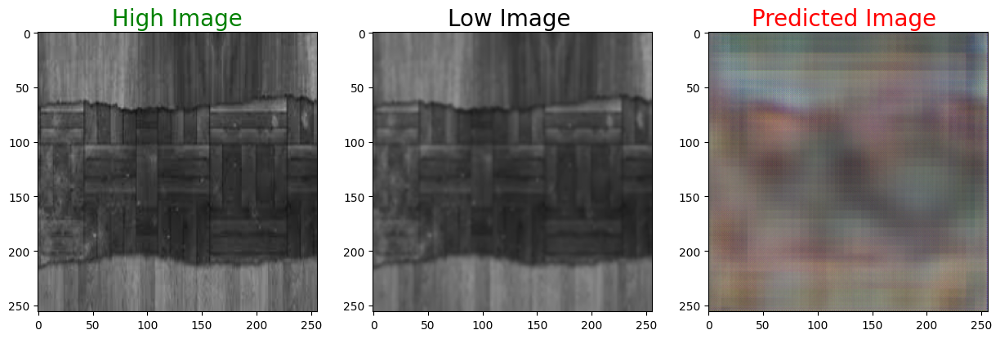

1/1 [==============================] - 1s 1s/step


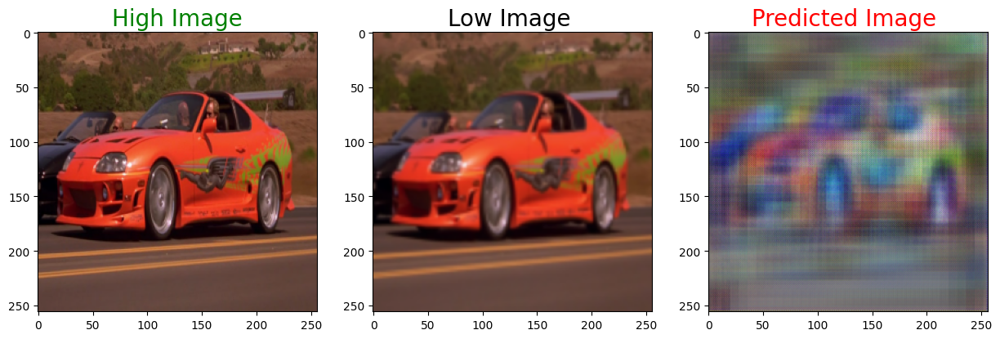

1/1 [==============================] - 2s 2s/step


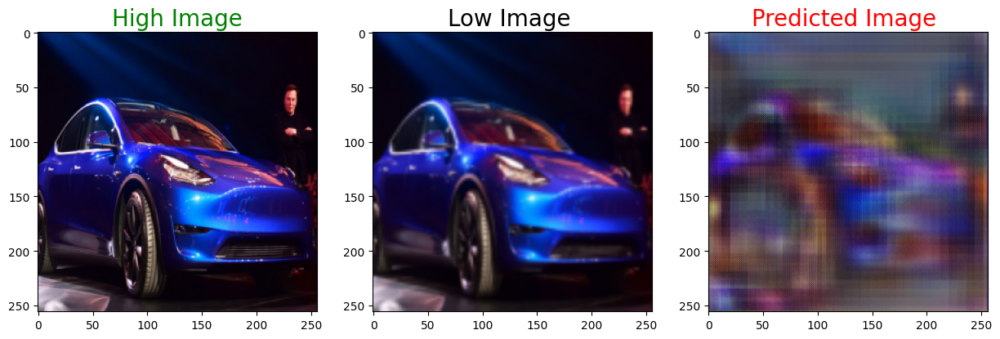

1/1 [==============================] - 1s 1s/step


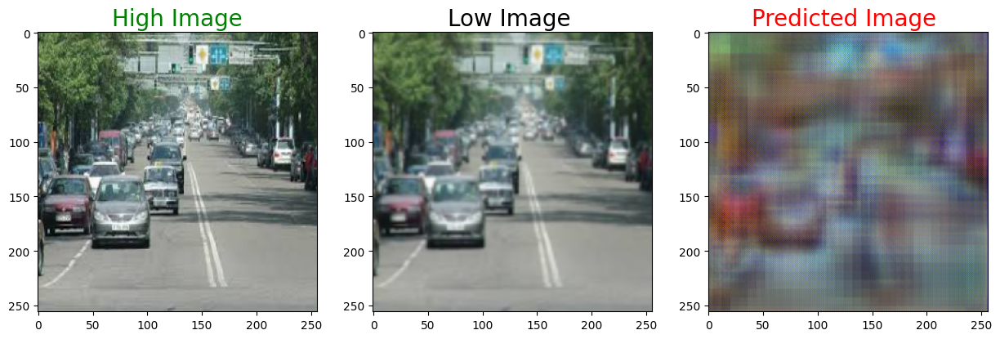

In [23]:
def plot_images(high,low,predicted3):
    plt.figure(figsize=(15,15))
    plt.subplot(1,3,1)
    plt.title('High Image', color = 'green', fontsize = 20)
    plt.imshow(high)
    plt.subplot(1,3,2)
    plt.title('Low Image ', color = 'black', fontsize = 20)
    plt.imshow(low)
    plt.subplot(1,3,3)
    plt.title('Predicted Image ', color = 'Red', fontsize = 20)
    plt.imshow(predicted3)

    plt.show()

for i in range(1,5):

    predicted3 = np.clip(model3.predict(test_low_image[i].reshape(1,SIZE, SIZE,3)),0.0,1.0).reshape(SIZE, SIZE,3)
    plot_images(test_high_image[i],test_low_image[i],predicted3)

***Calculating SSIM(Structural similarity index) and PSNR(Peak Signal-to-noise Ratio)***

In [24]:
import numpy as np
import tensorflow as tf
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.transform import resize

# generated high-resolution images: predicted3
# ground truth high-resolution images: test_high_image

# Calculate SSIM, PSNR for each generated and ground truth image
ssim_scores = []
psnr_scores = []

for i in range(len(predicted3)):
    if i < len(test_high_image):
        predicted_image = predicted3[i]
        test_high = test_high_image[i]

        # Resize images to the same dimensions
        predicted_resized = resize(predicted_image, test_high.shape, anti_aliasing=True)

        # Calculate SSIM
        ssim_score = ssim(predicted_resized, test_high, channel_axis=2)
        ssim_scores.append(ssim_score)

        # Calculate PSNR
        mse = np.mean((predicted_resized - test_high) ** 2)
        max_pixel = np.max(predicted_resized)
        psnr_score = 20 * np.log10(max_pixel) - 10 * np.log10(mse)
        psnr_scores.append(psnr_score)

        predicted_tensor = tf.convert_to_tensor(predicted_resized[np.newaxis, ...], dtype=tf.float32)
        test_high_tensor = tf.convert_to_tensor(test_high[np.newaxis, ...], dtype=tf.float32)

# Compute the average scores
average_ssim = sum(ssim_scores) / len(ssim_scores)
average_psnr = sum(psnr_scores) / len(psnr_scores)

# Print the average scores
print("Average SSIM:", average_ssim)
print("Average PSNR:", average_psnr)


Average SSIM: 0.39463171718212275
Average PSNR: 7.100076471956877


***Save the model***

In [25]:
model3.save("model3.h5")

***Load the model(if required)***

In [26]:
from keras.models import load_model
# Load the saved model
model3 = load_model('model3.h5')

**Analysis of Results:**

I have used accuracy, prediction visualization, other validation metrics like SSIM(Structural Similarity Index) and PSNR(Peak Signal-to-Noise Ratio) to see the quality and similarity between predicted image with the true high resolution image. In image processing tasks, accuracy alone is not enough for analyzing the models so I have considered all these metrics too.

*SSIM measures the structural similarity between two images. It produces a value between -1 and 1. Value closer to 1 indicates higher similarity between images whereas farther from 1 indicates low similarity.

*PSNR measures the quality of an image by comparing it to a reference image and calculating the ratio of the maximum possible power of the signal to the power of the noise present in the image. A higher PSNR value means higher image quality.

Here we are comparing predicted high resolution image with true high resolution image,

1. Sequential model with 10 epochs and batch size of 32 got an accuracy of 68%. Used adam optimizer and mean absolute error as loss. Got average ssim as 0.26 and average psnr as 8.79.

2. Functional API model with 15 epochs and batch size of 64 got an accuracy of 72%. Used adam optimizer and mean squared error as loss. Got average ssim as 0.23 and average psnr as 7.72.

3. VGG16 model with 20 epochs and batch size of 1 got an accuracy of 44%. Used rmsprop optimizer and mean absolute error as loss. Got average ssim as 0.34 and average psnr as 7.88.

4. VGG16 model with kernel regularizers used 5 epochs and batch size of 32 got an accuracy of 45%. Used adam optimizer and mean squared error as loss. Got average ssim as 0.39 and average psnr as 7.10.

Based on all the models, Functional API model got highest accuracy of 72%.

But all the models seem to have moderate similarity with true high resolution image so compared to all VGG16 model with kernel regularizers got high ssim score of 0.39 which is better of all models but not good in general which can be increased by more optimization.

Coming to PSNR score, Sequential model have high score of 8.79 which can be also be more better.

By seeing all metrics, we cannot say which model performed best of all so sometimes visualization says more than metrics, so seeing predicted images of all models, I can see that Sequential model images and Functional API model images are more clearer compared to all other models.

But based on accuracy sequential and Functional both seem to have high accuracy of 68% and 72%. I feel both of these predicted images are mostly similar but Sequential seems to be a bit more clearer than Functional API model.

 **Best model of all is Sequential model with 68% accuracy, ssim 0.26 and psnr 8.79.Second best is Functional API model with 72% accuracy, ssim 0.23 and psnr**

**References:**
Few blocks of code from https://www.kaggle.com/code/theblackmamba31/low-resolution-images-to-high-resolution/notebook.